In [1]:
import pm4py
import pandas as pd
import numpy as np
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualizer
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image

def import_csv(file_path):
    event_log = pm4py.read_xes(file_path, sep=';')
    event_log = pm4py.format_dataframe(event_log, case_id='CaseID', activity_key='Activity', timestamp_key='Timestamp')
    start_activities = pm4py.get_start_activities(event_log)
    end_activities = pm4py.get_end_activities(event_log)
    print("Start activities: {}\nEnd activities: {}".format(start_activities, end_activities))

#if __name__ == "__main__":
#    import_csv('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Event_log/log_Idaho_180724_ALL_subset.xes')

In [6]:
#if __name__ == "__main__":
#    log = pm4py.read_xes('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Event_log/log_Idaho_180724_ALL_subset.xes')

In [2]:
Case='Idaho'
timelog=pd.read_hdf('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Event_log/log_'+Case+'_151024_ALL_df.h5')
usuals=np.load('Data/'+Case+'/masklayers/usuals.npy', allow_pickle=True)[0]
keynames=list(usuals.keys())
#timelog=timelog[timelog['Crop'].isin(keynames)]
#timelog[timelog['Crop'].isin(keynames)].to_hdf('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Event_log/log_Idaho_180724_ALL_df_subset.h5', key='df', mode='w') 
if __name__ == "__main__":
    dataframe = pm4py.format_dataframe(timelog, case_id='CaseID', activity_key='Activity', timestamp_key='Timestamp')
    #dataframe = pm4py.format_dataframe(timelog, case_id='CaseID', activity_key='Activity', timestamp_key='Timestamp')
    log = pm4py.convert_to_event_log(dataframe)
title='Idaho'
title_s=title

C:\Users\Vito\AppData\Local\Temp\ipykernel_18724\1269143216.py:8: DeprecatedWarning: format_dataframe is deprecated as of 2.3.0 and will be removed in 3.0.0. the format_dataframe function does not need application anymore.
  dataframe = pm4py.format_dataframe(timelog, case_id='CaseID', activity_key='Activity', timestamp_key='Timestamp')
c:\Users\Vito\miniconda3\envs\gee\Lib\site-packages\pm4py\utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


In [15]:
#combining all cases
logs = []
crops=[]
for Case in ['Idaho', 'NorthDakota', 'Colorado']:
    timelog=pd.read_hdf('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Event_log/log_'+Case+'_151024_ALL_df.h5')
    usuals=np.load('Data/'+Case+'/masklayers/usuals.npy', allow_pickle=True)[0]
    keynames=list(usuals.keys())
    crops+=keynames
    logs.append(timelog[timelog['Crop'].isin(keynames)])
timelog=pd.concat(logs)
if __name__ == "__main__":
    dataframe = pm4py.format_dataframe(timelog, case_id='CaseID', activity_key='Activity', timestamp_key='Timestamp')
    #dataframe = pm4py.format_dataframe(timelog, case_id='CaseID', activity_key='Activity', timestamp_key='Timestamp')
    log = pm4py.convert_to_event_log(dataframe)
title='Idaho, NorthDakota, and Colorado'
title_s='Idaho_NorthDakota_Colorado'

C:\Users\Vito\AppData\Local\Temp\ipykernel_18724\1053600226.py:12: DeprecatedWarning: format_dataframe is deprecated as of 2.3.0 and will be removed in 3.0.0. the format_dataframe function does not need application anymore.
  dataframe = pm4py.format_dataframe(timelog, case_id='CaseID', activity_key='Activity', timestamp_key='Timestamp')
c:\Users\Vito\miniconda3\envs\gee\Lib\site-packages\pm4py\utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


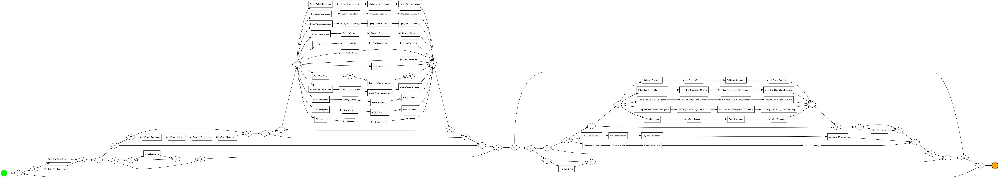

In [9]:
if __name__ == "__main__":
    process_tree = pm4py.discover_process_tree_inductive(log)
    bpmn_model = pm4py.convert_to_bpmn(process_tree)
    pm4py.view_bpmn(bpmn_model)

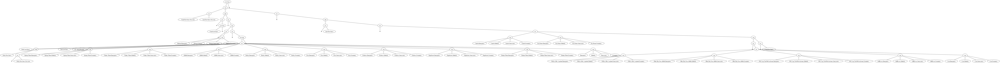

In [10]:
if __name__ == "__main__":
    process_tree = pm4py.discover_process_tree_inductive(log)
    pm4py.view_process_tree(process_tree)

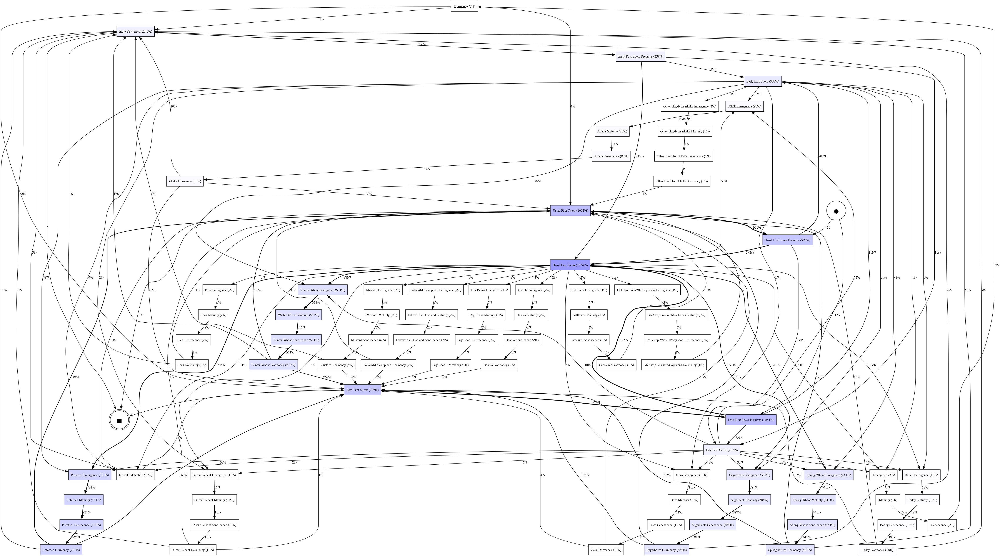

In [11]:
if __name__ == "__main__":
    dfg, start_activities, end_activities = pm4py.discover_dfg(log)
    pm4py.view_dfg(dfg, start_activities, end_activities)

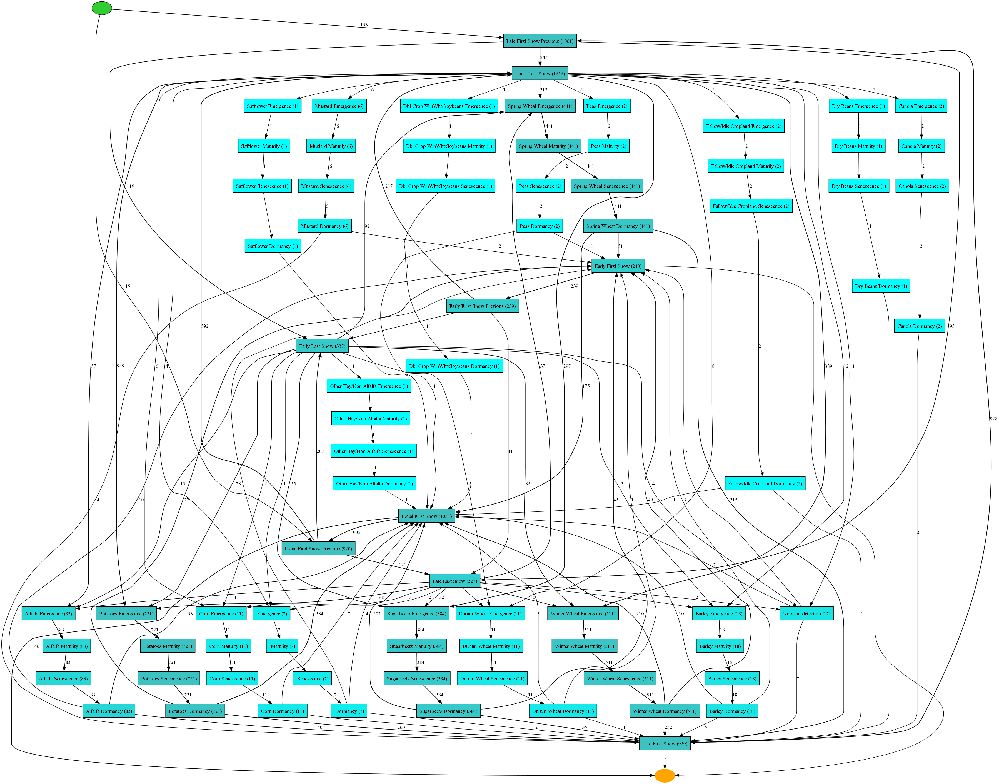

In [12]:
if __name__ == "__main__":
    map = pm4py.discover_heuristics_net(log)
    pm4py.view_heuristics_net(map)

In [8]:
count_dict={}
activity_counts = pm4py.get_event_attribute_values(log, "concept:name")

# Print the activity counts
for activity, count in activity_counts.items():
    count_dict[activity]=count
count_dict

{'Late First Snow Previous': 2186,
 'Early Last Snow': 2158,
 'Usual Emergence': 3855,
 'Maturity': 5389,
 'Senescence': 5389,
 'Late Dormancy': 3123,
 'Late First Snow': 1902,
 'Early First Snow Previous': 1837,
 'Late Emergence': 626,
 'Usual Dormancy': 2162,
 'Usual First Snow': 1695,
 'Usual First Snow Previous': 1366,
 'Usual Last Snow': 2289,
 'Early Emergence': 908,
 'Early First Snow': 1792,
 'Early Dormancy': 104,
 'Late Last Snow': 942}

In [ ]:
import inspect

source_file = inspect.getfile(dfg_visualizer)

print(f"The source file of the function/class is located at: {source_file}")

The source file of the function/class is located at: c:\Users\Vito\miniconda3\envs\gee\Lib\site-packages\pm4py\visualization\dfg\visualizer.py


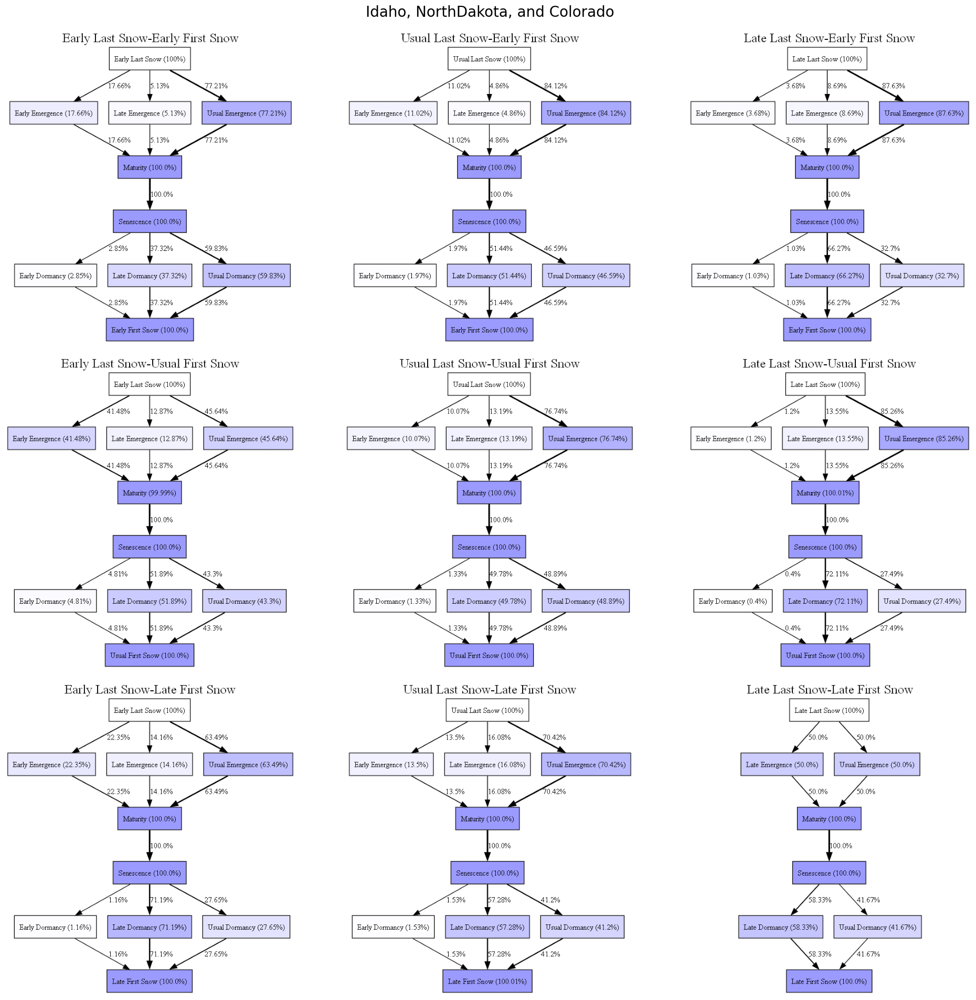

In [9]:
image_path=[]
start_ev=['Early Last Snow','Usual Last Snow','Late Last Snow']
end_ev=['Early First Snow','Usual First Snow','Late First Snow']
pairs=np.meshgrid(start_ev,end_ev)
start_flat=pairs[0].flatten()
end_flat=pairs[1].flatten()

#crop_lst=list(pm4py.get_event_attribute_values(log, "Crop").keys())
#counts=np.sum(list(pm4py.get_start_activities(log).values())) 
log=pm4py.filter_event_attribute_values(log,'Activity',values=['Early First Snow Previous','Usual First Snow Previous','Late First Snow Previous']
                                        , level="event", retain=False)
for i in range(len(start_flat)):
    log_temp=log
    for event in [start_flat[i],end_flat[i]]:
        log_temp=pm4py.filter_event_attribute_values(log_temp,'Activity',values=event, level="case", retain=True)
    #counts=pm4py.get_start_activities(log_temp).get(event)
    counts=np.sum(list(pm4py.get_start_activities(log_temp).values())) 
    activity_counts = pm4py.get_event_attribute_values(log, "concept:name")
    count_dict={}
    for activity, act_count in activity_counts.items():
        count_dict[activity]=act_count#/counts


    dfg, start_activities, end_activities = pm4py.discover_dfg(log_temp)
    #dfg=dfg_discovery.apply(log_temp,activity_counts)
    dfg_percentage = {key: round((value / counts) * 100,2) for key, value in dfg.items()}
    parameters = {
        dfg_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "pdf"
    }
    
    #pm4py.view_dfg(dfg_percentage, start_activities, end_activities)
    gviz = dfg_visualizer.apply(dfg_percentage)#, parameters=parameters)
    #if locator==1:
    gviz.attr(label=start_flat[i]+'-'+end_flat[i], fontsize='20', labelloc='t')
    #save the graph as a png file
    path='C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/dfg_com/'+Case+'_'+start_flat[i]+end_flat[i]
    path=path.replace(" ", "_")
    gviz.render(path, format='png')
    gviz.render(path, format='svg')
    image_path.append(path+'.png')

plt.figure(figsize=(20, 20))
for i,path in enumerate(image_path):
    img = mpimg.imread(path)
    plt.subplot(3, 3, i+1)
    
    plt.imshow(img)
    plt.axis('off')  # Hide axes
plt.suptitle(title,fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.99])
plt.savefig('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+title_s+'_DFG_byseason_pair.pdf')
plt.show()

c:\Users\Vito\miniconda3\envs\gee\Lib\site-packages\pm4py\utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


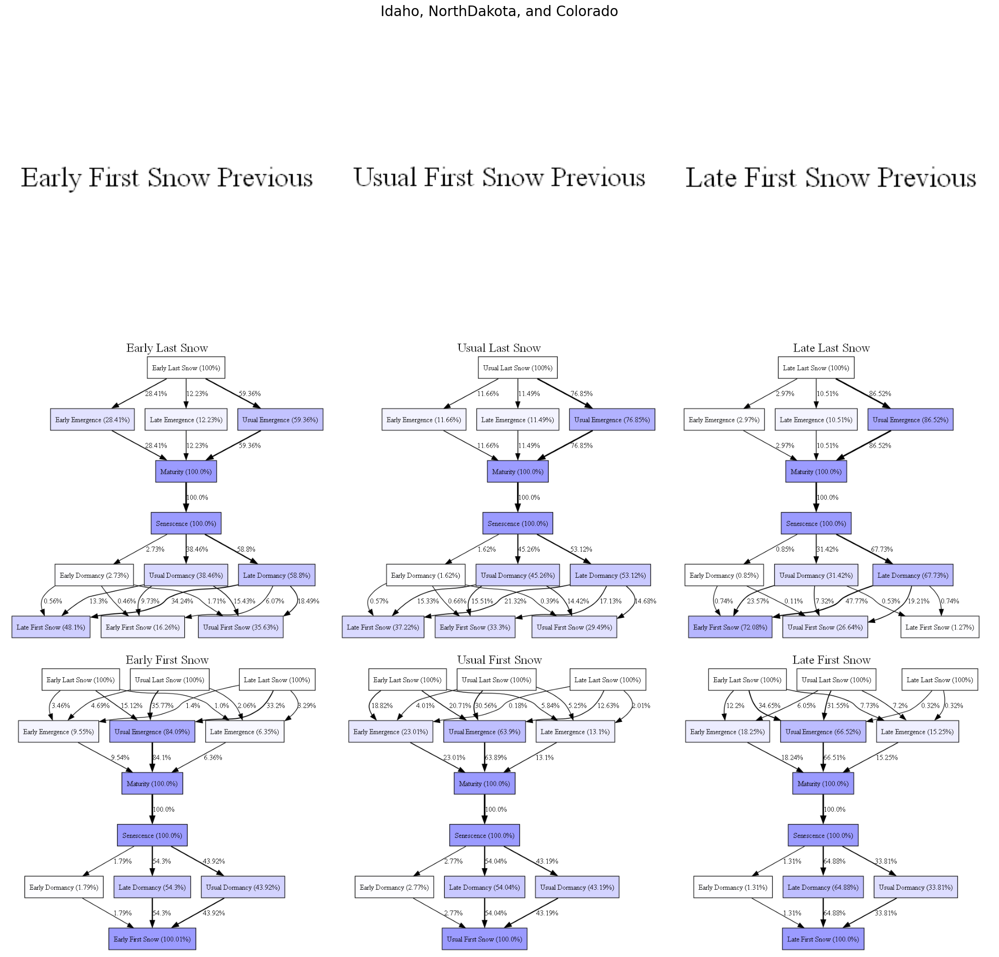

In [13]:
image_path=[]
log_start = ['Early First Snow Previous','Usual First Snow Previous','Late First Snow Previous'
             ,'Early Last Snow','Usual Last Snow','Late Last Snow'
             ,'Early First Snow','Usual First Snow','Late First Snow']
#crop_lst=list(pm4py.get_event_attribute_values(log, "Crop").keys())
counts=np.sum(list(pm4py.get_start_activities(log).values())) 
for event in log_start:
    if event[-8:]=='Previous':
        log_temp=pm4py.filter_start_activities(log, event)
    else:
        log_temp=pm4py.filter_event_attribute_values(log,'Activity',values=['Early First Snow Previous','Usual First Snow Previous','Late First Snow Previous']
                                        , level="event", retain=False)
        log_temp=pm4py.filter_event_attribute_values(log_temp,'Activity',values=event, level="case", retain=True)
    #counts if want relative frequency
    #counts=pm4py.get_start_activities(log_temp).get(event)
    counts=pm4py.get_event_attribute_values(log_temp, "concept:name").get(event)
    activity_counts = pm4py.get_event_attribute_values(log, "concept:name")
    count_dict={}
    for activity, act_count in activity_counts.items():
        count_dict[activity]=act_count#/counts
        #counts if want relative frequency


    dfg, start_activities, end_activities = pm4py.discover_dfg(log_temp)
    #dfg=dfg_discovery.apply(log_temp,activity_counts)
    dfg_percentage = {key: round((value / counts) * 100,2) for key, value in dfg.items()}
    parameters = {
        dfg_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "pdf"
    }
    
    #pm4py.view_dfg(dfg_percentage, start_activities, end_activities)
    gviz = dfg_visualizer.apply(dfg_percentage)#, parameters=parameters)
    #if locator==1:
    gviz.attr(label=event, fontsize='20', labelloc='t')
    #save the graph as a png file
    path='C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/dfg_com/'+Case+'_'+event
    path=path.replace(" ", "_")
    gviz.render(path, format='png')
    gviz.render(path, format='svg')
    image_path.append(path+'.png')

plt.figure(figsize=(20, 20))
for i,path in enumerate(image_path):
    img = mpimg.imread(path)
    plt.subplot(3, 3, i+1)
    
    plt.imshow(img)
    plt.axis('off')  # Hide axes
plt.suptitle(title,fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.99])
plt.savefig('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+title_s+'_DFG_byseason.pdf')
plt.show()

In [4]:
timelog=pd.read_hdf('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Event_log/log_Idaho_180724_ALL_df.h5')
words_to_remove = r'\b(Late|Usual|Early)\b\s*'
timelog['Activity'] = timelog['Activity'].str.replace(words_to_remove, '', regex=True)
timelog

,Activity,Timestamp,Time_uncertainty,Uncertainty_wdith,CaseID,Crop,SiteID,WGS84_lon_lat,County,State,Country,NDVI_range,num_valid_est,Multiple_crop
0,First Snow Previous,2007-12-12,2007-12-12 00:00:00,0,Idaho_0000_2008,Spring Wheat,0,"[-113.05221260418197, 42.746131542842555]",Power County,Idaho,United States,"[0.15711029814197652, 0.15711029814197652]",1,0
1,Last Snow,2008-03-09,2008-03-09 00:00:00,0,Idaho_0000_2008,Spring Wheat,0,"[-113.05221260418197, 42.746131542842555]",Power County,Idaho,United States,"[0.031742689872249284, 0.031742689872249284]",1,0
2,Emergence,2008-04-17,"[2008-04-17 00:00:00, 2008-04-22 00:00:00, 200...",5,Idaho_0000_2008,Spring Wheat,0,"[-113.05221260418197, 42.746131542842555]",Power County,Idaho,United States,"[0.24623152148456592, 0.2748453300330088]",3,0
3,Maturity,2008-07-03,"[2008-07-03 00:00:00, 2008-07-03 00:00:00, 200...",0,Idaho_0000_2008,Spring Wheat,0,"[-113.05221260418197, 42.746131542842555]",Power County,Idaho,United States,"[0.7282792829898052, 0.7282792829898052]",3,0
4,Senescence,2008-07-11,"[2008-07-11 00:00:00, 2008-07-11 00:00:00, 200...",0,Idaho_0000_2008,Spring Wheat,0,"[-113.05221260418197, 42.746131542842555]",Power County,Idaho,United States,"[0.7147539949549525, 0.7147539949549525]",3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15467,Emergence,2022-03-31,"[2022-03-31 00:00:00, 2022-04-29 00:00:00, 202...",30,Idaho_0147_2022,Potatoes,147,"[-112.79625830859523, 42.99857351545601]",Bingham County,Idaho,United States,"[0.23517282799312006, 0.4143923617169684]",3,0
15468,Maturity,2022-05-27,"[2022-05-26 00:00:00, 2022-05-27 00:00:00, 202...",1,Idaho_0147_2022,Potatoes,147,"[-112.79625830859523, 42.99857351545601]",Bingham County,Idaho,United States,"[0.5730146692455331, 0.5777535641067976]",3,0
15469,Senescence,2022-07-16,"[2022-07-17 00:00:00, 2022-07-16 00:00:00, 202...",1,Idaho_0147_2022,Potatoes,147,"[-112.79625830859523, 42.99857351545601]",Bingham County,Idaho,United States,"[0.7452750766949859, 0.7576112774114492]",3,0
15470,Dormancy,2022-09-23,"[2022-09-30 00:00:00, 2022-09-26 00:00:00, 202...",7,Idaho_0147_2022,Potatoes,147,"[-112.79625830859523, 42.99857351545601]",Bingham County,Idaho,United States,"[0.23708450574658352, 0.24654820119621298]",3,0


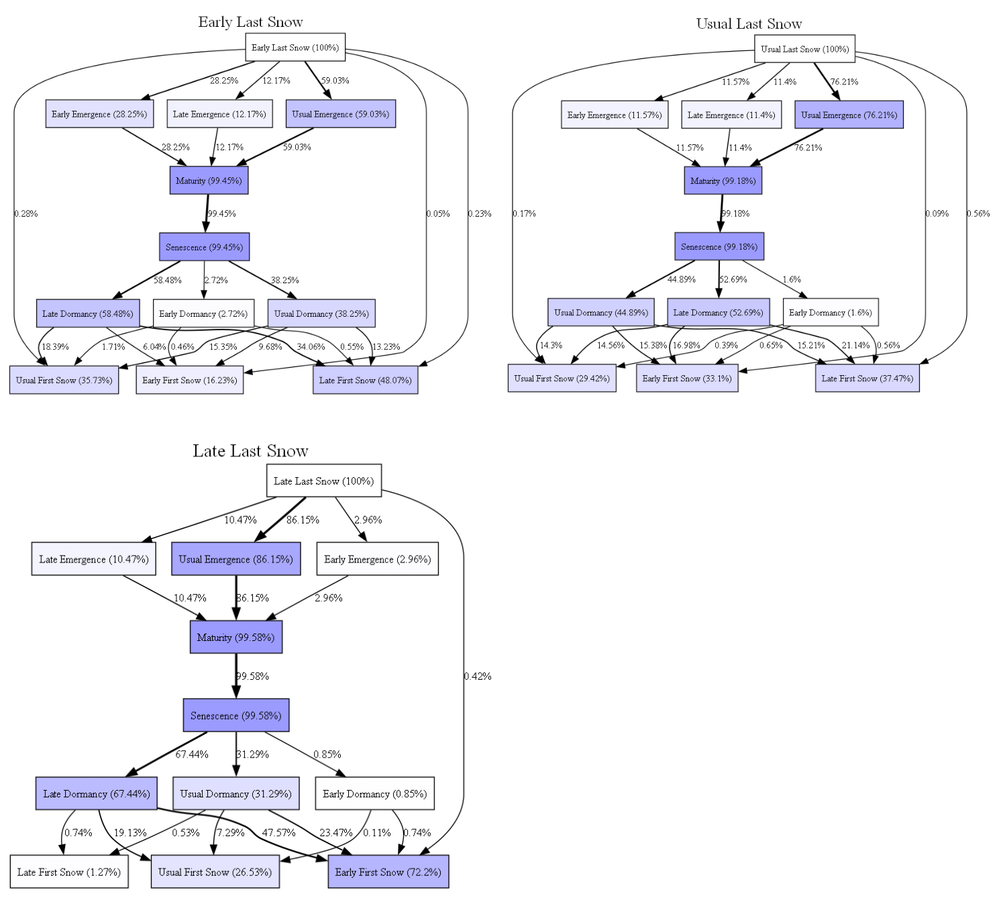

In [10]:
plt.figure(figsize=(15, 15))
for i,path in enumerate(image_path[3:6]):
    img = mpimg.imread(path)
    plt.subplot(2, 2, i+1)

    plt.imshow(img)
    plt.axis('off')  # Hide axes
#plt.suptitle(title,fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.99])
plt.savefig('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+title_s+'_DFG_lastsnow2.pdf')
plt.show()

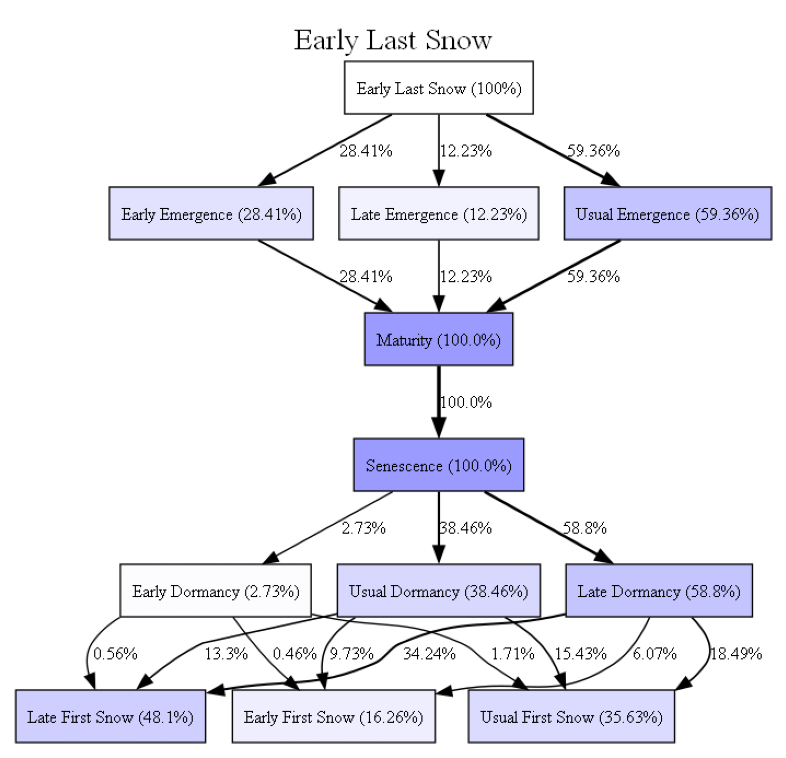

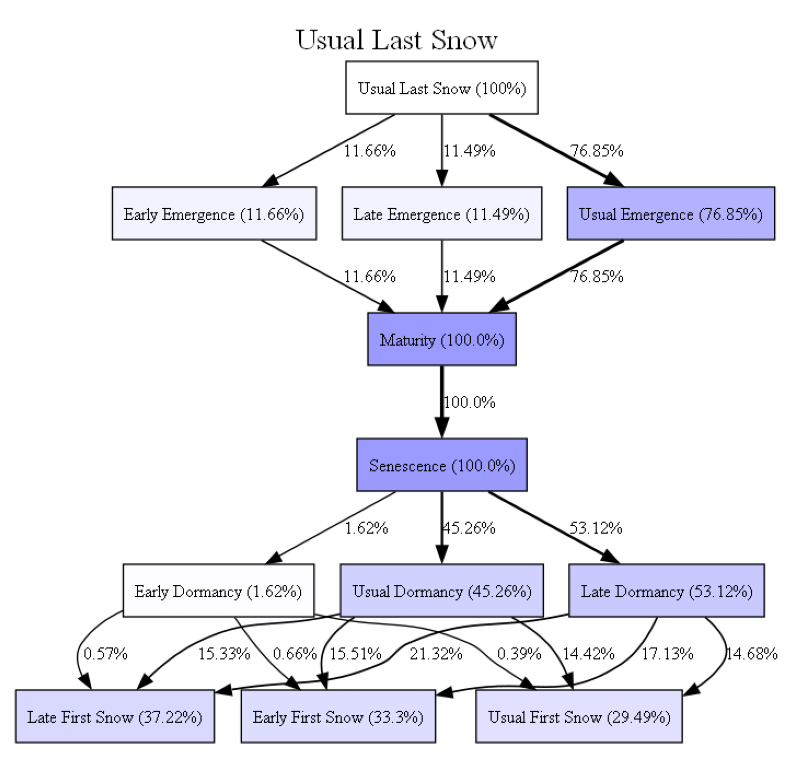

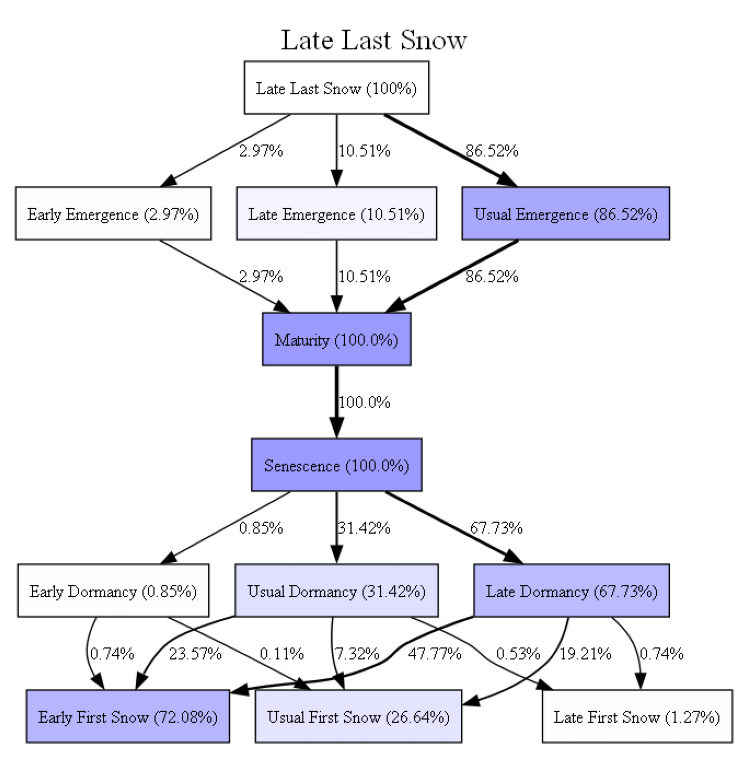

In [14]:
plt.figure(figsize=(10, 8))
#for i,path in enumerate(image_path[3:6]):
img = mpimg.imread(image_path[3])
#plt.subplot(1, 3, i+1)

plt.imshow(img)
plt.axis('off') 
#plt.suptitle(title,fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.99])
plt.savefig('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+title_s+'_DFG_earlylastsnow.pdf')
plt.show()

plt.figure(figsize=(10, 8))
img = mpimg.imread(image_path[4])

plt.imshow(img)
plt.axis('off')
plt.tight_layout(rect=[0, 0.03, 1, 0.99])
plt.savefig('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+title_s+'_DFG_usuallastsnow.pdf')
plt.show()

plt.figure(figsize=(10, 8))
img = mpimg.imread(image_path[5])

plt.imshow(img)
plt.axis('off')  
plt.tight_layout(rect=[0, 0.03, 1, 0.99])
plt.savefig('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+title_s+'_DFG_latelastsnow.pdf')
plt.show()

c:\Users\Vito\miniconda3\envs\gee\Lib\site-packages\pm4py\utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


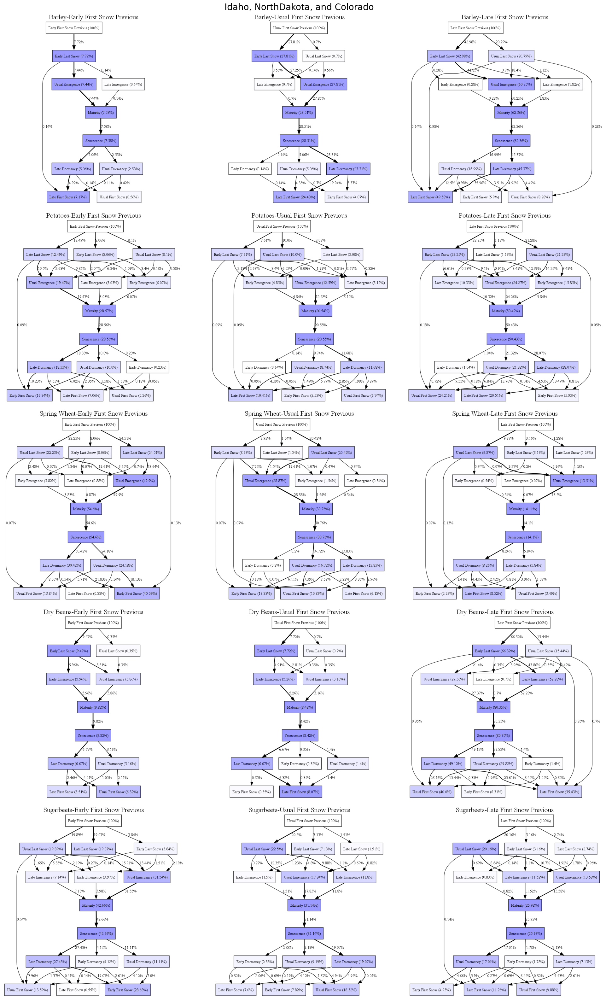

In [47]:
image_path=[]
log_start = ['Early First Snow Previous','Usual First Snow Previous','Late First Snow Previous']
crop_lst=list(pm4py.get_event_attribute_values(log, "Crop").keys())

for i in range(len(crop_lst)):
    crop_log=pm4py.filter_event_attribute_values(log, "Crop", crop_lst[i], level="event", retain=True)
    locator=0
    counts=np.sum(list(pm4py.get_start_activities(crop_log).values())) 
    for event in log_start:
        log_temp=pm4py.filter_start_activities(crop_log, event)
        #counts=pm4py.get_start_activities(log_temp).get(event)
        activity_counts = pm4py.get_event_attribute_values(log, "concept:name")
        count_dict={}
        for activity, act_count in activity_counts.items():
            count_dict[activity]=act_count#/counts


        dfg, start_activities, end_activities = pm4py.discover_dfg(log_temp)
        #dfg=dfg_discovery.apply(log_temp,activity_counts)
        dfg_percentage = {key: round((value / counts) * 100,2) for key, value in dfg.items()}
        parameters = {
            dfg_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "pdf"
        }
        
        #pm4py.view_dfg(dfg_percentage, start_activities, end_activities)
        gviz = dfg_visualizer.apply(dfg_percentage)#, parameters=parameters)
        #if locator==1:
        gviz.attr(label=crop_lst[i]+'-'+event, fontsize='20', labelloc='t')
        locator+=1
        #save the graph as a png file
        path='C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/dfg_com/'+Case+'_'+crop_lst[i]+'_'+event
        path=path.replace(" ", "_")
        gviz.render(path, format='png')
        gviz.render(path, format='svg')
        image_path.append(path+'.png')

plt.figure(figsize=(20, 20*len(crop_lst)/3))
for i,path in enumerate(image_path):
    img = mpimg.imread(path)
    plt.subplot(len(crop_lst), 3, i+1)
    
    plt.imshow(img)
    plt.axis('off')  # Hide axes
plt.suptitle(title,fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.99])
plt.savefig('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+title_s+'_DFG_bycrop.pdf')
plt.show()

c:\Users\Vito\miniconda3\envs\gee\Lib\site-packages\pm4py\utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


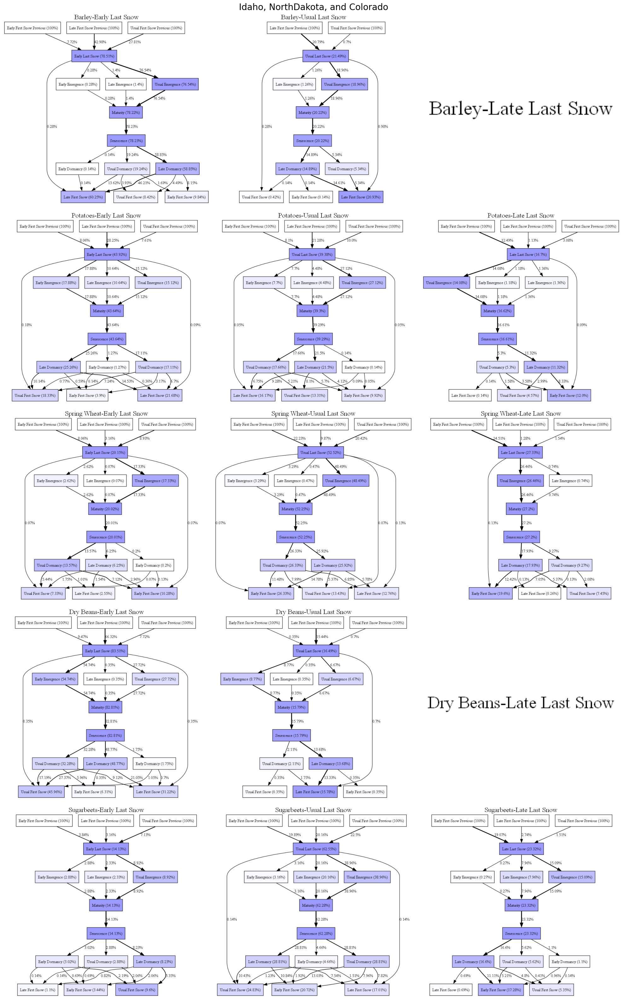

In [48]:
image_path=[]
log_start = ['Early Last Snow','Usual Last Snow','Late Last Snow']
crop_lst=list(pm4py.get_event_attribute_values(log, "Crop").keys())

for i in range(len(crop_lst)):
    crop_log=pm4py.filter_event_attribute_values(log, "Crop", crop_lst[i], level="event", retain=True)
    locator=0
    counts=np.sum(list(pm4py.get_start_activities(crop_log).values())) 
    for event in log_start:
        log_temp=pm4py.filter_event_attribute_values(crop_log,'Activity',values=event, level="case", retain=True)
        #counts = 0
        #for trace in log_temp:
        #    for ev in trace:
        #        if ev["Activity"] == event:
        #            counts += 1

        activity_counts = pm4py.get_event_attribute_values(log, "concept:name")
        count_dict={}
        for activity, act_count in activity_counts.items():
            count_dict[activity]=act_count#/counts


        dfg, start_activities, end_activities = pm4py.discover_dfg(log_temp)
        #dfg=dfg_discovery.apply(log_temp,activity_counts)
        dfg_percentage = {key: round((value / counts) * 100,2) for key, value in dfg.items()}
        parameters = {
            dfg_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "pdf"
        }
        
        #pm4py.view_dfg(dfg_percentage, start_activities, end_activities)
        gviz = dfg_visualizer.apply(dfg_percentage)#, parameters=parameters)
        #if locator==1:
        gviz.attr(label=crop_lst[i]+'-'+event, fontsize='20', labelloc='t')
        locator+=1
        #save the graph as a png file
        path='C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/dfg_com/'+Case+'_'+crop_lst[i]+'_'+event
        path=path.replace(" ", "_")
        gviz.render(path, format='png')
        gviz.render(path, format='svg')
        image_path.append(path+'.png')

plt.figure(figsize=(20, 20*len(crop_lst)/3))
for i,path in enumerate(image_path):
    img = mpimg.imread(path)
    plt.subplot(len(crop_lst), 3, i+1)
    plt.imshow(img)
    plt.axis('off')  # Hide axes
plt.suptitle(title,fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.99])
plt.savefig('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+title_s+'_bycrop_lastsnow.pdf')
plt.show()

c:\Users\Vito\miniconda3\envs\gee\Lib\site-packages\pm4py\utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


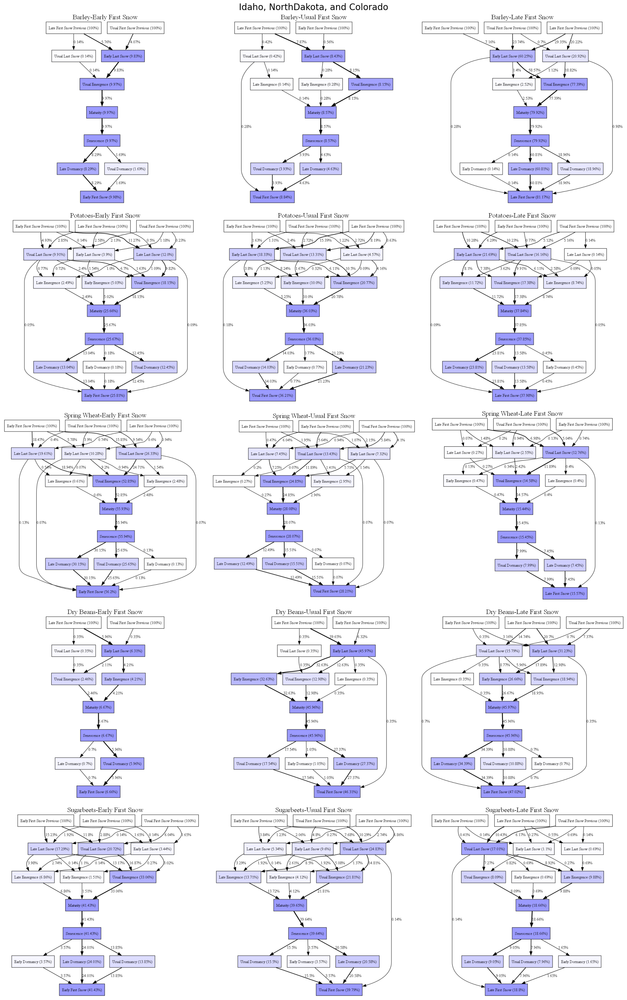

In [49]:
image_path=[]
log_start = ['Early First Snow','Usual First Snow','Late First Snow']
crop_lst=list(pm4py.get_event_attribute_values(log, "Crop").keys())

for i in range(len(crop_lst)):
    crop_log=pm4py.filter_event_attribute_values(log, "Crop", crop_lst[i], level="event", retain=True)
    locator=0
    counts=np.sum(list(pm4py.get_start_activities(crop_log).values())) 
    for event in log_start:
        log_temp=pm4py.filter_event_attribute_values(crop_log,'Activity',values=event, level="case", retain=True)
        #counts = 0
        #for trace in log_temp:
        #    for ev in trace:
        #        if ev["Activity"] == event:
        #            counts += 1

        activity_counts = pm4py.get_event_attribute_values(log, "concept:name")
        count_dict={}
        for activity, act_count in activity_counts.items():
            count_dict[activity]=act_count#/counts


        dfg, start_activities, end_activities = pm4py.discover_dfg(log_temp)
        #dfg=dfg_discovery.apply(log_temp,activity_counts)
        dfg_percentage = {key: round((value / counts) * 100,2) for key, value in dfg.items()}
        parameters = {
            dfg_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "pdf"
        }
        
        #pm4py.view_dfg(dfg_percentage, start_activities, end_activities)
        gviz = dfg_visualizer.apply(dfg_percentage)#, parameters=parameters)
        #if locator==1:
        gviz.attr(label=crop_lst[i]+'-'+event, fontsize='20', labelloc='t')
        locator+=1
        #save the graph as a png file
        path='C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/dfg_com/'+Case+'_'+crop_lst[i]+'_'+event
        path=path.replace(" ", "_")
        gviz.render(path, format='png')
        gviz.render(path, format='svg')
        image_path.append(path+'.png')


plt.figure(figsize=(20, 20*len(crop_lst)/3))
for i,path in enumerate(image_path):
    img = mpimg.imread(path)
    plt.subplot(len(crop_lst), 3, i+1)
    plt.imshow(img)
    plt.axis('off')  # Hide axes
plt.suptitle(title,fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.99])
plt.savefig('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+title_s+'_bycrop_firstsnow.pdf')
plt.show()

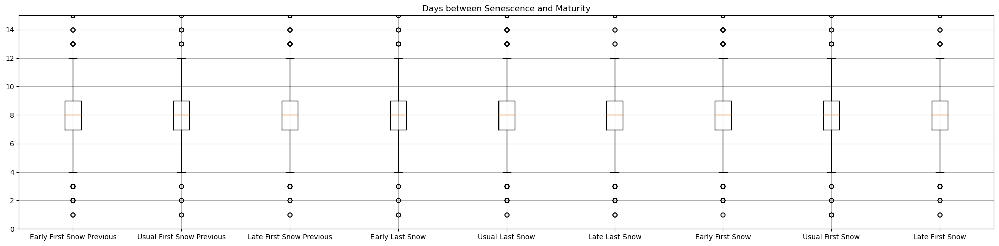

In [94]:
log_start = ['Early First Snow Previous','Usual First Snow Previous','Late First Snow Previous'
             ,'Early Last Snow','Usual Last Snow','Late Last Snow'
             ,'Early First Snow','Usual First Snow','Late First Snow']

plt.figure(figsize=(20, 5))
for i in range(len(log_start)):
    templog = timelog[timelog['CaseID'].isin(timelog[timelog['Activity']==log_start[i]]['CaseID'])]
    day_of_year = templog[templog['Activity']=='Maturity']['Timestamp'].dt.dayofyear
    doy_mt=np.array([x for x in day_of_year])
    day_of_year = templog[templog['Activity']=='Senescence']['Timestamp'].dt.dayofyear
    doy_sc=np.array([x for x in day_of_year])
    day_of_year = templog[templog['Activity']=='Emergence']['Timestamp'].dt.dayofyear
    doy_em=np.array([x for x in day_of_year])
    day_of_year = templog[templog['Activity']=='Dormancy']['Timestamp'].dt.dayofyear
    doy_dr=np.array([x for x in day_of_year])
    #plt.subplot(3, 3, i+1)
    plt.boxplot([doy_sc-doy_mt], positions = [i])
plt.xticks(range(len(log_start)), log_start)
plt.grid()
plt.ylim(0,15)
plt.title('Days between Senescence and Maturity')

plt.tight_layout()
plt.show()


In [ ]:
#log_start = ['Early First Snow Previous','Usual First Snow Previous','Late First Snow Previous'
log_start_i = ['Early Last Snow','Usual Last Snow','Late Last Snow']
log_start_j = ['Early First Snow','Usual First Snow','Late First Snow']

plt.figure(figsize=(20, 5))
for i in range(len(log_start)):
    templog = timelog[timelog['CaseID'].isin(timelog[timelog['Activity']==log_start[i]]['CaseID'])]
    day_of_year = templog[templog['Activity']=='Maturity']['Timestamp'].dt.dayofyear
    doy_mt=np.array([x for x in day_of_year])
    day_of_year = templog[templog['Activity']=='Senescence']['Timestamp'].dt.dayofyear
    doy_sc=np.array([x for x in day_of_year])
    day_of_year = templog[templog['Activity']=='Emergence']['Timestamp'].dt.dayofyear
    doy_em=np.array([x for x in day_of_year])
    day_of_year = templog[templog['Activity']=='Dormancy']['Timestamp'].dt.dayofyear
    doy_dr=np.array([x for x in day_of_year])
    #plt.subplot(3, 3, i+1)
    plt.boxplot([doy_sc-doy_mt], positions = [i])
plt.xticks(range(len(log_start)), log_start)
plt.grid()
plt.ylim(0,15)
plt.title('Days between Senescence and Maturity')

plt.tight_layout()
plt.show()

In [97]:
templog

,Activity,Timestamp,Time_uncertainty,Uncertainty_wdith,CaseID,Crop,SiteID,WGS84_lon_lat,County,State,Country,NDVI_range,num_valid_est,Multiple_crop,case:concept:name,concept:name,time:timestamp
7,Early First Snow Previous,2008-10-14,2008-10-14 00:00:00,0,Idaho_0000_2009,Potatoes,0,"[-113.05221260418197, 42.746131542842555]",Power County,Idaho,United States,"[0.215133255145746, 0.215133255145746]",1,0,Idaho_0000_2009,Early First Snow Previous,2008-10-14
8,Usual Last Snow,2009-02-19,2009-02-19 00:00:00,0,Idaho_0000_2009,Potatoes,0,"[-113.05221260418197, 42.746131542842555]",Power County,Idaho,United States,"[0.08400220029999818, 0.08400220029999818]",1,0,Idaho_0000_2009,Usual Last Snow,2009-02-19
9,Usual Emergence,2009-05-25,"[2009-05-25 00:00:00, 2009-05-30 00:00:00, 200...",6,Idaho_0000_2009,Potatoes,0,"[-113.05221260418197, 42.746131542842555]",Power County,Idaho,United States,"[0.3323555281285728, 0.3423009660737608]",3,0,Idaho_0000_2009,Usual Emergence,2009-05-25
10,Maturity,2009-07-09,"[2009-07-11 00:00:00, 2009-07-10 00:00:00, 200...",2,Idaho_0000_2009,Potatoes,0,"[-113.05221260418197, 42.746131542842555]",Power County,Idaho,United States,"[0.7382487070816395, 0.7390740802064252]",3,0,Idaho_0000_2009,Maturity,2009-07-09
11,Senescence,2009-07-18,"[2009-07-20 00:00:00, 2009-07-19 00:00:00, 200...",2,Idaho_0000_2009,Potatoes,0,"[-113.05221260418197, 42.746131542842555]",Power County,Idaho,United States,"[0.7163113028521516, 0.7209488504160323]",3,0,Idaho_0000_2009,Senescence,2009-07-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16458,Late Emergence,2021-06-12,"[2021-06-12 00:00:00, 2021-06-18 00:00:00, 202...",11,Colorado_0159_2021,Potatoes,159,"[-106.10772880580106, 37.62885163335957]",Rio Grande County,Colorado,United States,"[0.26725899986100143, 0.30330579968591076]",3,0,Colorado_0159_2021,Late Emergence,2021-06-12
16459,Maturity,2021-07-20,"[2021-07-20 00:00:00, 2021-07-20 00:00:00, 202...",0,Colorado_0159_2021,Potatoes,159,"[-106.10772880580106, 37.62885163335957]",Rio Grande County,Colorado,United States,"[0.7261686440241508, 0.7261686440241508]",3,0,Colorado_0159_2021,Maturity,2021-07-20
16460,Senescence,2021-07-28,"[2021-07-28 00:00:00, 2021-07-28 00:00:00, 202...",0,Colorado_0159_2021,Potatoes,159,"[-106.10772880580106, 37.62885163335957]",Rio Grande County,Colorado,United States,"[0.6924919442634028, 0.6924919442634028]",3,0,Colorado_0159_2021,Senescence,2021-07-28
16461,Early Dormancy,2021-08-30,"[2021-08-30 00:00:00, 2021-08-28 00:00:00, 202...",2,Colorado_0159_2021,Potatoes,159,"[-106.10772880580106, 37.62885163335957]",Rio Grande County,Colorado,United States,"[0.17497093081801113, 0.17569411644481858]",3,0,Colorado_0159_2021,Early Dormancy,2021-08-30


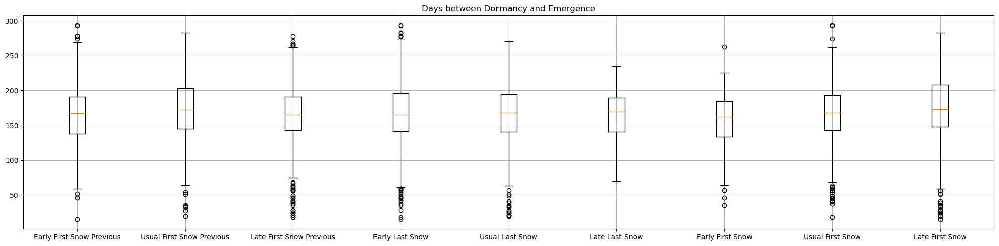

In [100]:
log_start = ['Early First Snow Previous','Usual First Snow Previous','Late First Snow Previous'
             ,'Early Last Snow','Usual Last Snow','Late Last Snow'
             ,'Early First Snow','Usual First Snow','Late First Snow']

plt.figure(figsize=(20, 5))
for i in range(len(log_start)):
    templog = timelog[timelog['CaseID'].isin(timelog[timelog['Activity']==log_start[i]]['CaseID'])]
    day_of_year = templog[templog['Activity'].isin(['Early Emergence', 'Usual Emergence', 'Late Emergence'])]['Timestamp'].dt.dayofyear
    doy_em = np.array([x for x in day_of_year])
    day_of_year = templog[templog['Activity'].isin(['Early Dormancy', 'Usual Dormancy', 'Late Dormancy'])]['Timestamp'].dt.dayofyear
    doy_dr = np.array([x for x in day_of_year])
    #plt.subplot(3, 3, i+1)
    plt.boxplot([doy_dr-doy_em], positions = [i])
plt.xticks(range(len(log_start)), log_start)
plt.grid()
#plt.ylim(0,15)
plt.title('Days between Dormancy and Emergence')

plt.tight_layout()
plt.show()

In [74]:
log_start = ['Early First Snow Previous','Usual First Snow Previous','Late First Snow Previous'
             ,'Early Last Snow','Usual Last Snow','Late Last Snow'
             ,'Early First Snow','Usual First Snow','Late First Snow']

timelog[timelog['Activity']==log_start[0]]['CaseID']

7           Idaho_0000_2009
112         Idaho_0001_2009
217         Idaho_0002_2009
252         Idaho_0002_2014
322         Idaho_0003_2009
                ...        
15991    Colorado_0154_2014
16043    Colorado_0154_2022
16183    Colorado_0156_2012
16288    Colorado_0157_2012
16379    Colorado_0159_2010
Name: CaseID, Length: 1844, dtype: object

{'whiskers': [<matplotlib.lines.Line2D at 0x1b5f19ee550>,
 'caps': [<matplotlib.lines.Line2D at 0x1b5f1dd9a50>,
 'boxes': [<matplotlib.lines.Line2D at 0x1b5f1008a10>],
 'medians': [<matplotlib.lines.Line2D at 0x1b5f4337990>],
 'fliers': [<matplotlib.lines.Line2D at 0x1b5f4336f90>],
 'means': []}

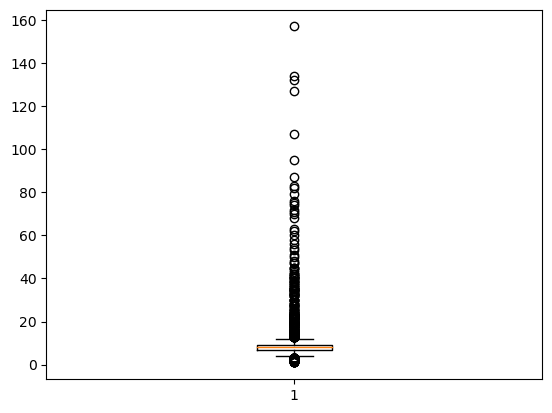

In [73]:
plt.boxplot(doy_sc-doy_mt)

C:\Users\Vito\AppData\Local\Temp\ipykernel_14568\1624736042.py:1: DeprecatedWarning: view_dotted_chart is deprecated as of 2.3.0 and will be removed in 3.0.0. the dotted chart visualization will be removed in a future release.
  pm4py.view_dotted_chart(crop_log,format='png', show_legend=False)
c:\Users\Vito\miniconda3\envs\gee\Lib\site-packages\pm4py\visualization\dotted_chart\__init__.py:21: UserWarning: The dotted_chart visualizer will be removed in a future release.
  warnings.warn("The dotted_chart visualizer will be removed in a future release.")


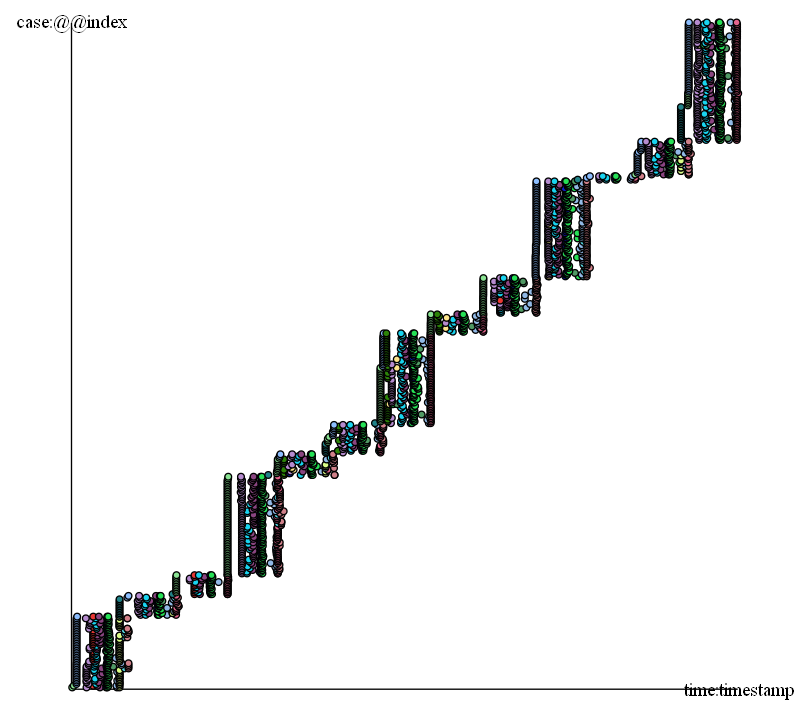

In [ ]:
pm4py.view_dotted_chart(crop_log,format='png', show_legend=False)

In [ ]:
pm4py.view_dotted_chart(log,format='png',attributes=['Timestamp','SiteID'], show_legend=True)

C:\Users\Vito\AppData\Local\Temp\ipykernel_14568\1782552352.py:10: DeprecatedWarning: save_vis_dotted_chart is deprecated as of 2.3.0 and will be removed in 3.0.0. the dotted chart visualization will be removed in a future release.
  pm4py.save_vis_dotted_chart(crop_log,file_path=path+'.png',attributes=['Timestamp','SiteID'], show_legend=True)


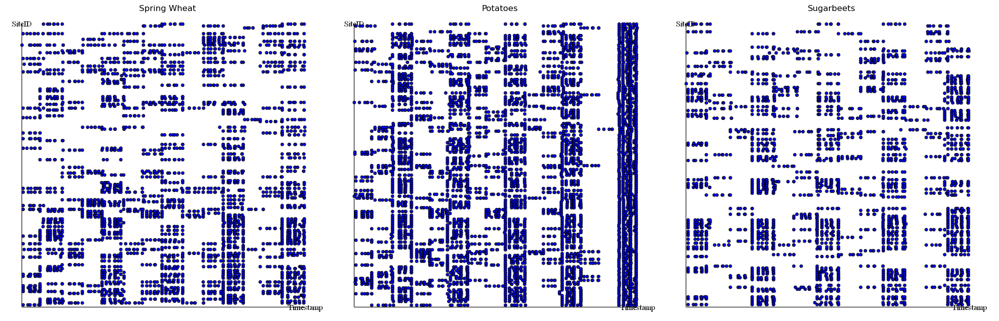

In [ ]:
image_path=[]
log_start = ['Early First Snow Previous','Usual First Snow Previous','Late First Snow Previous']
crop_lst=list(pm4py.get_event_attribute_values(log, "Crop").keys())
#plt.figure(figsize=(20, 20))
#p=0
for i in range(len(crop_lst)):
    crop_log=pm4py.filter_event_attribute_values(log, "Crop", crop_lst[i], level="event", retain=True)
    path='C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+Case+'_'+crop_lst[i]+'_'+event+'_dotted_percrop'
    path=path.replace(" ", "_")
    pm4py.save_vis_dotted_chart(crop_log,file_path=path+'.png',attributes=['Timestamp','SiteID'], show_legend=True)
    
    image_path.append(path+'.png')

titles=np.array(crop_lst)
plt.figure(figsize=(20, 20))
for i,path in enumerate(image_path):
    img = mpimg.imread(path)
    plt.subplot(1, 3, i+1)
    plt.title(titles[i])
    plt.imshow(img)
    plt.axis('off')  # Hide axes
plt.tight_layout()
plt.savefig('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+Case+'_dotted_percrop.pdf')
plt.show()

In [ ]:
image_path=[]
log_start = ['Early First Snow Previous','Usual First Snow Previous','Late First Snow Previous']
crop_lst=list(pm4py.get_event_attribute_values(log, "Crop").keys())
#plt.figure(figsize=(20, 20))
#p=0
for i in range(len(crop_lst)):
    crop_log=pm4py.filter_event_attribute_values(log, "Crop", crop_lst[i], level="event", retain=True)
    locator=0
    for event in log_start:
        log_temp=pm4py.filter_start_activities(crop_log, event)

        path='C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+Case+'_'+crop_lst[i]+'_'+event+'_dotted'
        path=path.replace(" ", "_")
        pm4py.save_vis_dotted_chart(log_temp,file_path=path+'.png',attributes=['Timestamp','SiteID'], show_legend=False)
        
        image_path.append(path+'.png')

c:\Users\Vito\miniconda3\envs\gee\Lib\site-packages\pm4py\utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")
C:\Users\Vito\AppData\Local\Temp\ipykernel_18652\1536973386.py:14: DeprecatedWarning: save_vis_dotted_chart is deprecated as of 2.3.0 and will be removed in 3.0.0. the dotted chart visualization will be removed in a future release.
  pm4py.save_vis_dotted_chart(log_temp,file_path=path+'.png',attributes=['Timestamp','SiteID'], show_legend=False)


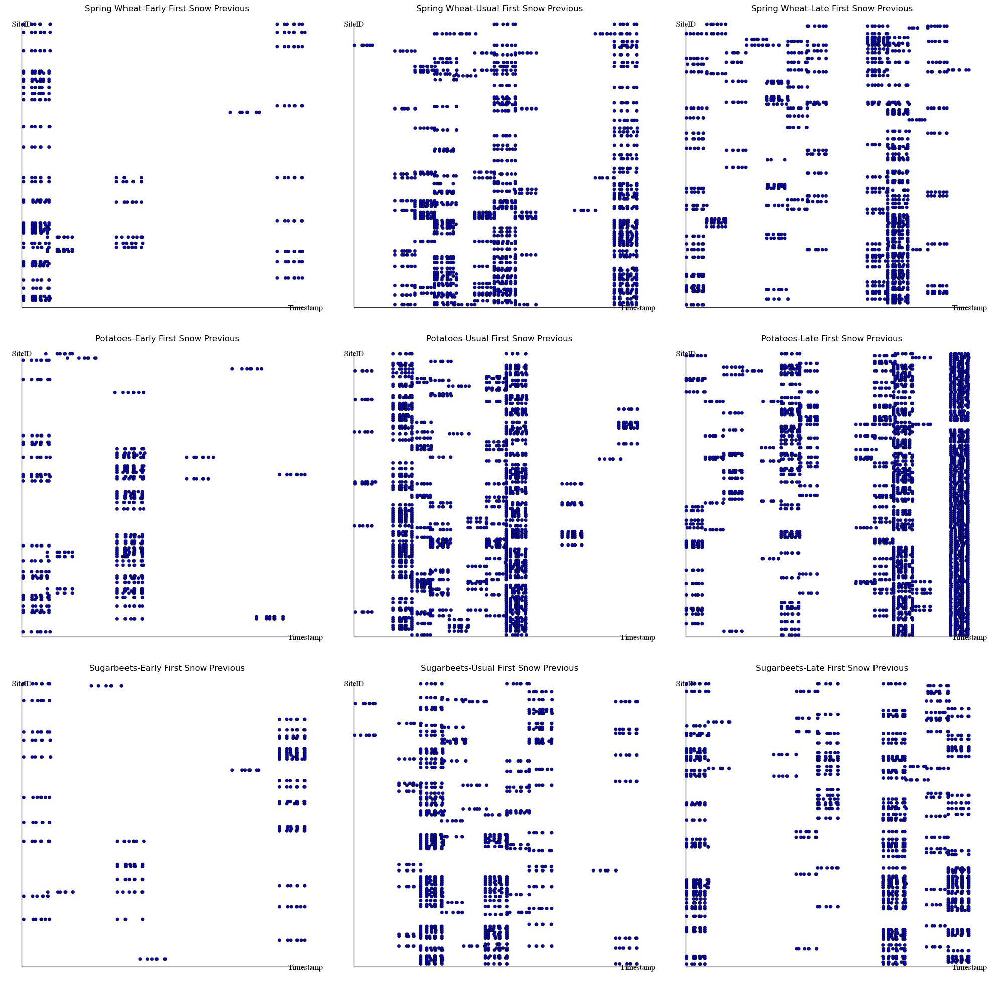

In [ ]:
titles=np.array(np.meshgrid(np.array(crop_lst),np.array(log_start))).T.reshape(-1,2)
plt.figure(figsize=(20, 20))
for i,path in enumerate(image_path):
    img = mpimg.imread(path)
    plt.subplot(3, 3, i+1)
    plt.title(titles[i,0]+'-'+titles[i,1])
    plt.imshow(img)
    plt.axis('off')  # Hide axes
plt.tight_layout()
plt.savefig('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+Case+'_dotted.pdf')
plt.show()

In [ ]:
#without previouse snow
Case='Idaho'
timelog=pd.read_hdf('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Event_log/log_'+Case+'_180724_ALL_df.h5')
usuals=np.load('Data/'+Case+'/masklayers/usuals.npy', allow_pickle=True)[0]
keynames=list(usuals.keys())
timelog=timelog[timelog['Crop'].isin(keynames)]
log_start = ['Early First Snow Previous','Usual First Snow Previous','Late First Snow Previous']
timelog=timelog[~timelog['Activity'].isin(log_start)]
#timelog[timelog['Crop'].isin(keynames)].to_hdf('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Event_log/log_Idaho_180724_ALL_df_subset.h5', key='df', mode='w') 
if __name__ == "__main__":
    dataframe = pm4py.format_dataframe(timelog, case_id='CaseID', activity_key='Activity', timestamp_key='Timestamp')
    #dataframe = pm4py.format_dataframe(timelog, case_id='CaseID', activity_key='Activity', timestamp_key='Timestamp')
    log = pm4py.convert_to_event_log(dataframe)

C:\Users\Vito\AppData\Local\Temp\ipykernel_37104\3690278839.py:11: DeprecatedWarning: format_dataframe is deprecated as of 2.3.0 and will be removed in 3.0.0. the format_dataframe function does not need application anymore.
  dataframe = pm4py.format_dataframe(timelog, case_id='CaseID', activity_key='Activity', timestamp_key='Timestamp')
c:\Users\Vito\miniconda3\envs\gee\Lib\site-packages\pm4py\utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


In [ ]:
image_path=[]
log_start = ['Early Last Snow','Usual Last Snow','Late Last Snow']
crop_lst=list(pm4py.get_event_attribute_values(log, "Crop").keys())

for i in range(len(crop_lst)):
    crop_log=pm4py.filter_event_attribute_values(log, "Crop", crop_lst[i], level="event", retain=True)
    locator=0
    for event in log_start:
        log_temp=pm4py.filter_start_activities(crop_log, event)
        counts=pm4py.get_start_activities(log_temp).get(event)
        activity_counts = pm4py.get_event_attribute_values(log, "concept:name")
        count_dict={}
        for activity, act_count in activity_counts.items():
            count_dict[activity]=act_count#/counts


        dfg, start_activities, end_activities = pm4py.discover_dfg(log_temp)
        #dfg=dfg_discovery.apply(log_temp,activity_counts)
        dfg_percentage = {key: round((value / counts) * 100,2) for key, value in dfg.items()}
        parameters = {
            dfg_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "pdf"
        }
        
        #pm4py.view_dfg(dfg_percentage, start_activities, end_activities)
        gviz = dfg_visualizer.apply(dfg_percentage)#, parameters=parameters)
        if locator==1:
            gviz.attr(label=crop_lst[i], fontsize='20', labelloc='t')
        else:
            gviz.attr(label='', fontsize='20', labelloc='t')
        locator+=1
        #save the graph as a png file
        path='C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+Case+'_'+crop_lst[i]+'_'+event+'_no_previous'
        path=path.replace(" ", "_")
        gviz.render(path, format='png')
        gviz.render(path, format='svg')
        image_path.append(path+'.png')

c:\Users\Vito\miniconda3\envs\gee\Lib\site-packages\pm4py\utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


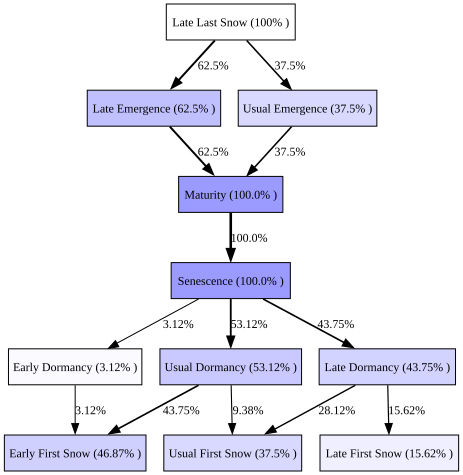

In [ ]:
gviz

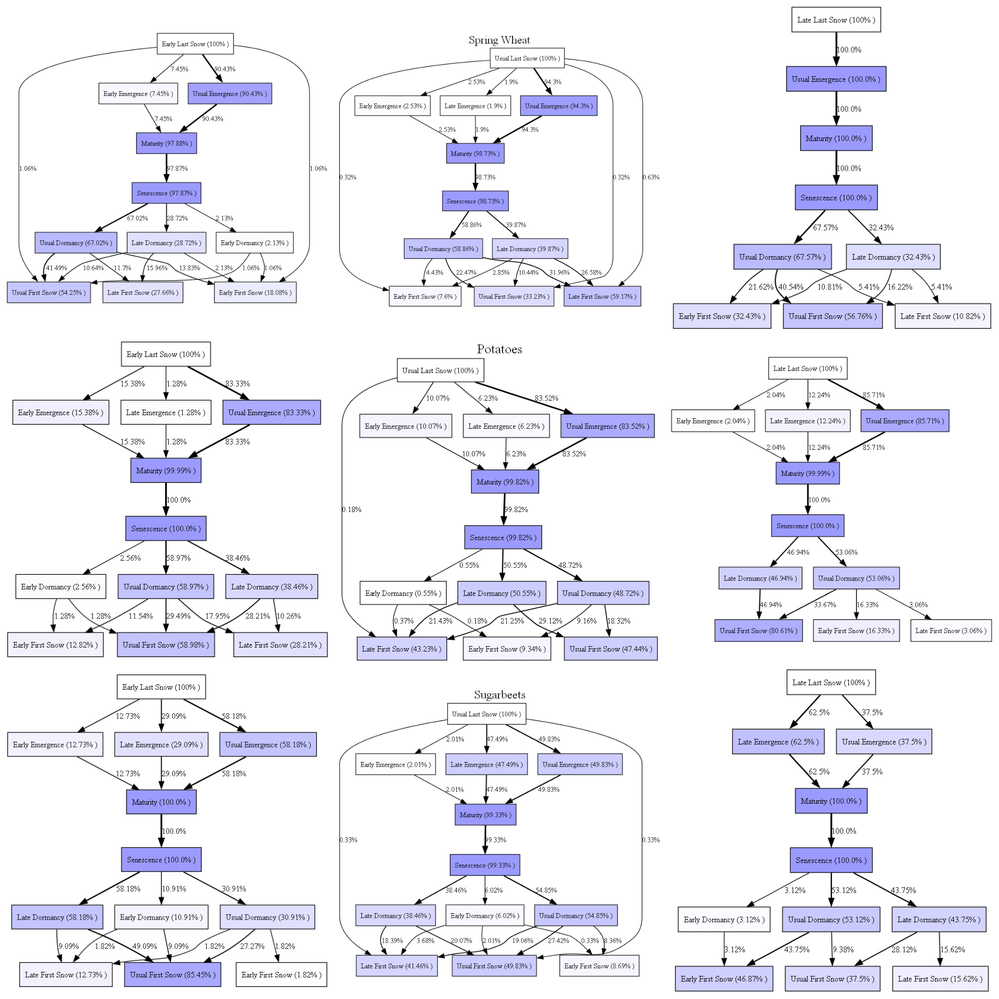

In [ ]:
plt.figure(figsize=(20, 20))
for i,path in enumerate(image_path):
    img = mpimg.imread(path)
    plt.subplot(3, 3, i+1)
    
    plt.imshow(img)
    plt.axis('off')  # Hide axes
plt.tight_layout()
plt.savefig('C:/Users/Vito/Documents/Seed_to_harvest_process_monitoring/Figure/'+Case+'_no_previouse_DFG.pdf')
plt.show()

c:\Users\Vito\miniconda3\envs\gee\Lib\site-packages\pm4py\utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


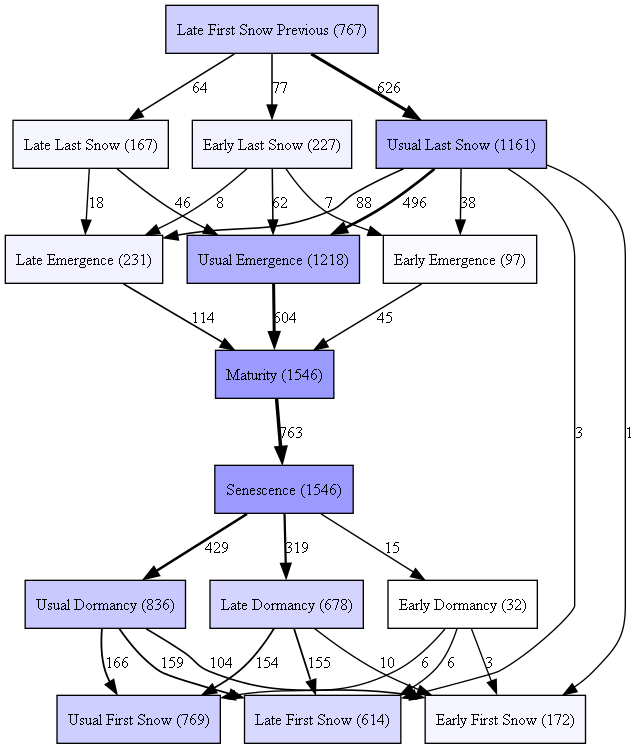

In [ ]:
from pm4py.visualization.dfg import visualizer as dfg_visualization
activity_to_filter = list(log_start.keys())[0]
log_temp=pm4py.filter_start_activities(log, list(log_start.keys())[0])
counts=pm4py.get_start_activities(log_temp).get(activity_to_filter)

#dfg = dfg_discovery.apply(log_temp)
dfg, start_activities, end_activities = pm4py.discover_dfg(log_temp)

dfg_freq = dfg_discovery.apply(log_temp)
gviz_freq = dfg_visualization.apply(dfg_freq, log=log, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz_freq)

In [ ]:
import pm4py.llm as llm
llm.abstract_dfg(log_temp)

ModuleNotFoundError: No module named 'pm4py.llm'

In [ ]:
from pm4py.objects.log.importer.xes import importer as xes_importer
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer


heu_net = heuristics_miner.apply_heu(log)

for node in heu_net.nodes.values():
    for connections in node.connections.values():
        for i in range(len(connections)):
            connections[i] = np.round((connections[i] /  len(np.unique(timelog['CaseID']))) * 100, 2)

parameters = {
    hn_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "svg"
}
gviz = hn_visualizer.apply(heu_net, parameters=parameters)
hn_visualizer.view(gviz)

AttributeError: 'Node' object has no attribute 'connections'

In [ ]:
from pyvis.network import Network
dfg = dfg_discovery.apply(log)

# Calculate total frequency
total_frequency = sum(dfg.values())

# Convert frequencies to percentages and round to 2 decimal places
dfg_percentage = {key: np.round((value / total_frequency) * 100, 2) for key, value in dfg.items()}

# Create a Pyvis network
net = Network(height='750px', width='100%', directed=True)
net.barnes_hut()

# Add nodes and edges to the network
nodes = set()
for (source, target), weight in dfg_percentage.items():
    nodes.add(source)
    nodes.add(target)
    net.add_node(source, label=source)
    net.add_node(target, label=target)
    net.add_edge(source, target, value=weight, title=f'{weight}%')

# Generate and show the network
net.show('dfg.html')

dfg.html


AttributeError: 'NoneType' object has no attribute 'render'